### The Final Week Capstone Project

In [ ]:
#### DO NOT RUN THE FOURSQUARE API, YOU HAVE THE DATAFRAMES

### Problem Statement:
My family and I would like to go to Canada. We are justifying which city to choose from. Would it be Toronto, Canada 
or Montreal Canada.  We need to see the similarities and disimilarities of both cities.  We will get to see the most common venues for both.

### Project Background:
Toronto and Montreal are two distinct flavor Canadian cities. Toronto is a financial capital of Canada and may be a modern city and Montreal 
is seen as more historic, cultural and Europe-leaning, particularly in regard to its French roots. As a data Scientist, we will see both of the cities venues.

### Data & Resources used
List of postal codes of Canada Wiki: https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M for access to neighborhood data of Toronto region.

List of postal codes of Canada Wiki https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_H for access to neighborhood data of Montreal region.

Geolocator or geographical coordinates of the neighborhoods: http://cocl.us/Geospatial_data for getting the longitude and latitude data for the neighborhoods.

Foursquare database: https://Foursquare.com to be used in order to explore the desired neighborhood data for various restaurant details and access the JSON files. This data shall be utilized to map the Indian restaurants in various locations.
Problem solving strategy

Step-1: Using Beautiful Soup, web scraping of the neighborhood data from postal codes of Canada Wiki-link. Clean the Toronto data by removing the missing values and store the data in a python Dataframe consisting of three columns namely: PostalCode, Borough, and Neighborhood.

Step-2: Using Beautiful Soup, web scraping of the neighborhood data from postal codes of Canada Wiki-link. Clean the Montreal data by removing the missing values and store the data in a python Dataframe consisting of three columns namely: PostalCode, Borough, and Neighborhood.

Step-3: Either use geolocator or take the help of long-lat data from the geospatial data wikilink and append the geographical coordinates in the above dataframes to get new respective dataframes for further analysis.

Step-4: Getting location data using the Foursquare API. It will be used to retrieve information of the common venues in Toronto and Montreal neighborhoods. The API will return a JSON file which will be further converted into a Python Dataframe.

Step-5: Exploratory Data Analysis

Plot the prepared location data on the map for visualization purposes.
Plot and find the relationship between Neighborhoods and Various Restaurants for both cities.
List down the 10 most common venues for both cities.
Step-6: Lastly we will discuss the results based on the above findings and provide a snapshot of both cities which will help make a exploratory choice of our family vacation. 

In [2]:
# Download the dependencies we need
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Libraries imported.


# Download and explore dataset - Wikipedia Toronto, Canada 

In [3]:
url = 'https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M'
r_Toronto = requests.get(url)
r_Toronto

<Response [200]>

In [4]:
len(r_Toronto.text)

83035

## Step 2: Beautiful Stop on Toronto, Canada 
Using Beautiful Soap to parse the html wikipedia Toronto, Canada website

In [5]:
import re
from bs4 import BeautifulSoup
# parse the HTML from our URL into the BeautifulSoup parse tree format
soup = BeautifulSoup(r_Toronto.text, 'html.parser')
#print(soup)
#table = soup.find_all('table')[0]
#table
# The HTML <td> element is found in an HTML table within the <body> tag. 
#The <td> tag defines the standard cells in the table which are displayed as 
#normal-weight, left-aligned text. The <tr> tag defines the table rows. 
#There must be at least one row in the table.

table_contents=[]
table=soup.find('table') 

#print("\n"*3)
#print(table)
cell = {}
for row in table.findAll('td'):

    if row.span.text=='Not assigned':
        pass
    else:
        cell['PostalCode'] = row.p.text[:3]
        table_contents.append(cell)        
        cell['Borough'] = (row.span.text).split('(')[0]
        cell['Neighborhood'] = (((((row.span.text).split('(')[1]).strip(')')).replace(' /',',')).replace(')',' ')).strip(' ')
        table_contents.append(cell)
      
df1=pd.DataFrame(table_contents)  


In [6]:
df1

,PostalCode,Borough,Neighborhood
0,M8Z,Etobicoke,"Mimico NW, The Queensway West, South of Bloor,..."
1,M8Z,Etobicoke,"Mimico NW, The Queensway West, South of Bloor,..."
2,M8Z,Etobicoke,"Mimico NW, The Queensway West, South of Bloor,..."
3,M8Z,Etobicoke,"Mimico NW, The Queensway West, South of Bloor,..."
4,M8Z,Etobicoke,"Mimico NW, The Queensway West, South of Bloor,..."
5,M8Z,Etobicoke,"Mimico NW, The Queensway West, South of Bloor,..."
6,M8Z,Etobicoke,"Mimico NW, The Queensway West, South of Bloor,..."
7,M8Z,Etobicoke,"Mimico NW, The Queensway West, South of Bloor,..."
8,M8Z,Etobicoke,"Mimico NW, The Queensway West, South of Bloor,..."
9,M8Z,Etobicoke,"Mimico NW, The Queensway West, South of Bloor,..."


In [7]:
import re
from bs4 import BeautifulSoup
# parse the HTML from our URL into the BeautifulSoup parse tree format
soup = BeautifulSoup(r_Toronto.text, 'html.parser')
soup
#table = soup.find_all('table')[0]
#table
# The HTML <td> element is found in an HTML table within the <body> tag. 
#The <td> tag defines the standard cells in the table which are displayed as 
#normal-weight, left-aligned text. The <tr> tag defines the table rows. 
#There must be at least one row in the table.

table_contents=[]
table=soup.find('table')
for row in table.findAll('td'):
#    cell = {}
    if row.span.text=='Not assigned':
        pass
    else:
        PostalCode = row.p.text[:3]  # This one i understand
        Borough = (row.span.text).split('(')[0]
        Neighborhood = (((((row.span.text).split('(')[1]).strip(')')).replace(' /',',')).replace(')',' ')).strip(' ')
        table_contents.append((PostalCode,Borough,Neighborhood)) # Put in a tuple()

df1 = pd.DataFrame(table_contents, columns=['PostalCode', 'Borough', 'Neighborhood'])        

df1

,PostalCode,Borough,Neighborhood
0,M3A,North York,Parkwoods
1,M4A,North York,Victoria Village
2,M5A,Downtown Toronto,"Regent Park, Harbourfront"
3,M6A,North York,"Lawrence Manor, Lawrence Heights"
4,M7A,Queen's Park,Ontario Provincial Government
5,M9A,Etobicoke,Islington Avenue
6,M1B,Scarborough,"Malvern, Rouge"
7,M3B,North York,Don Mills North
8,M4B,East York,"Parkview Hill, Woodbine Gardens"
9,M5B,Downtown Toronto,"Garden District, Ryerson"


## Step 3: Using Geospatial data to get Latitudes and Longitudes
Either use geolocator or take the help of long-lat data from the geospatial data wikilink and 
append the geographical coordinates in the above dataframes to get new respective dataframes for further analysis.

In [8]:
df2 = pd.read_csv('Geospatial_Coordinates.csv')

# To match both df1 and df2 dataframes, rename Postal Code -> PostalCode

df2 = df2.rename(columns={"Postal Code":"PostalCode"}) # To match both dataframe needed to rename the Postal Code -> Postal
df2

,PostalCode,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476
5,M1J,43.744734,-79.239476
6,M1K,43.727929,-79.262029
7,M1L,43.711112,-79.284577
8,M1M,43.716316,-79.239476
9,M1N,43.692657,-79.264848


In [9]:
Toronto_data = pd.merge(df1, df2, on="PostalCode")
Toronto_data

,PostalCode,Borough,Neighborhood,Latitude,Longitude
0,M3A,North York,Parkwoods,43.753259,-79.329656
1,M4A,North York,Victoria Village,43.725882,-79.315572
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636
3,M6A,North York,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763
4,M7A,Queen's Park,Ontario Provincial Government,43.662301,-79.389494
5,M9A,Etobicoke,Islington Avenue,43.667856,-79.532242
6,M1B,Scarborough,"Malvern, Rouge",43.806686,-79.194353
7,M3B,North York,Don Mills North,43.745906,-79.352188
8,M4B,East York,"Parkview Hill, Woodbine Gardens",43.706397,-79.309937
9,M5B,Downtown Toronto,"Garden District, Ryerson",43.657162,-79.378937


# Download and explore dataset - Wikipedia Montreal, Canada 

In [10]:
url = 'https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_H'
r_Montreal = requests.get(url)
r_Montreal

<Response [200]>

## Step 2: Beautiful Soup on Montreal, Canada
Using Beautiful Soap to parse the html wikipedia Montreal, Canada website

In [12]:
import re
from bs4 import BeautifulSoup
# parse the HTML from our URL into the BeautifulSoup parse tree format
soup = BeautifulSoup(r_Montreal.text, 'html.parser')
table=soup.find('table')
#print(table)
Borough = []
PostalCode = []
Neighborhood = []
for row in table.findAll('td'):

    if row.span.text=='Not assigned':
        pass
    else:
        PostalCode.append(row.p.text[:3])  # This one i understand
        for link in table.find_all('a'):
            Borough.append(link.get('title'))

    

In [13]:
# Place Postal Code and Borough in a Dataframe
Montreal = pd.DataFrame(list(zip(PostalCode, Borough)), columns = ['PostalCode','Borough'])
Montreal

,PostalCode,Borough
0,H1A,Pointe-aux-Trembles
1,H2A,"Saint-Michel district, Quebec"
2,H3A,Downtown Montreal
3,H4A,McGill University
4,H5A,"Notre-Dame-de-Grâce, Quebec"
5,H7A,Place Bonaventure
6,H9A,"Duvernay-Est, Quebec"
7,H1B,Dollard-des-Ormeaux
8,H2B,"Montreal East, Quebec"
9,H3B,"Ahuntsic, Quebec"


In [14]:
# Getting the Neighborhoods from Postal Codes in csv file
Montreal_Neighborhood = pd.read_csv('Montreal-Neighborhood.csv')
Montreal_Neighborhood

,PostalCode,Neighborhood
0,H1A,Pointe-Aux-Trembles
1,H2A,Saint-Michel East
2,H3A,Downtown Montreal North
3,H4A,McGill University
4,H5A,Notre-Dame-de-Grâce Northeast
5,H7A,Place Bonaventure
6,H9A,Duvernay-Est
7,H1B,Ormeaux Northwest
8,H2B,Montreal East
9,H3B,Ahuntsic North


In [15]:
# Merging the Borough by Postal codes
Montreal_New = pd.merge(Montreal, Montreal_Neighborhood, on="PostalCode")
Montreal_New

,PostalCode,Borough,Neighborhood
0,H1A,Pointe-aux-Trembles,Pointe-Aux-Trembles
1,H2A,"Saint-Michel district, Quebec",Saint-Michel East
2,H3A,Downtown Montreal,Downtown Montreal North
3,H4A,McGill University,McGill University
4,H5A,"Notre-Dame-de-Grâce, Quebec",Notre-Dame-de-Grâce Northeast
5,H7A,Place Bonaventure,Place Bonaventure
6,H9A,"Duvernay-Est, Quebec",Duvernay-Est
7,H1B,Dollard-des-Ormeaux,Ormeaux Northwest
8,H2B,"Montreal East, Quebec",Montreal East
9,H3B,"Ahuntsic, Quebec",Ahuntsic North


## Step 3. Using Geocoder to get Latitudes and Longitudes for Montreal, Canada

In [16]:
# Note this is the geocoder, the latitudes and longitudes are a list.
import geocoder # import geocoder

postal_code = Montreal_New['PostalCode']

# Using while Statement
latitude = []
longitude = []
Post_Code = []
n = 0

while n < len(postal_code):
    g = geocoder.arcgis('{}, Montreal, Ontario'.format(postal_code[n]))
    lat_lng_coords = g.latlng
#    print('The geograpical coordinate of {} are {}, {}.'.format(postal_code[n], lat_lng_coords[0], lat_lng_coords[1]))
    latitude.append(lat_lng_coords[0])
    longitude.append(lat_lng_coords[1])
    Post_Code.append(postal_code[n])
    n = n + 1

latitude = [round(elem, 2) for elem in latitude]
longitude = [round(elem, 2) for elem in longitude]




In [17]:
# Create a Dataframe for Postal Codes, Latitudes and Longitudes
Postal = pd.DataFrame(list(zip(Post_Code, latitude, longitude)), columns = ['PostalCode','Latitude','Longitude'])
Postal

,PostalCode,Latitude,Longitude
0,H1A,45.67,-73.50
1,H2A,45.44,-75.64
2,H3A,45.44,-75.64
3,H4A,45.44,-75.64
4,H5A,45.44,-75.64
5,H7A,45.44,-75.64
6,H9A,45.44,-75.64
7,H1B,45.65,-73.51
8,H2B,44.42,-80.10
9,H3B,44.42,-80.10


In [18]:
# Merge both df1 and df2 dataframes for Montreal, Canada
Montreal_data = pd.merge(Montreal_New, Postal, on="PostalCode")
Montreal_data

,PostalCode,Borough,Neighborhood,Latitude,Longitude
0,H1A,Pointe-aux-Trembles,Pointe-Aux-Trembles,45.67,-73.50
1,H2A,"Saint-Michel district, Quebec",Saint-Michel East,45.44,-75.64
2,H3A,Downtown Montreal,Downtown Montreal North,45.44,-75.64
3,H4A,McGill University,McGill University,45.44,-75.64
4,H5A,"Notre-Dame-de-Grâce, Quebec",Notre-Dame-de-Grâce Northeast,45.44,-75.64
5,H7A,Place Bonaventure,Place Bonaventure,45.44,-75.64
6,H9A,"Duvernay-Est, Quebec",Duvernay-Est,45.44,-75.64
7,H1B,Dollard-des-Ormeaux,Ormeaux Northwest,45.65,-73.51
8,H2B,"Montreal East, Quebec",Montreal East,44.42,-80.10
9,H3B,"Ahuntsic, Quebec",Ahuntsic North,44.42,-80.10


In [19]:
# Drop unwanted NaN's from 'Neighborhood'
Montreal_data = Montreal_data.dropna ()
Montreal_data

,PostalCode,Borough,Neighborhood,Latitude,Longitude
0,H1A,Pointe-aux-Trembles,Pointe-Aux-Trembles,45.67,-73.50
1,H2A,"Saint-Michel district, Quebec",Saint-Michel East,45.44,-75.64
2,H3A,Downtown Montreal,Downtown Montreal North,45.44,-75.64
3,H4A,McGill University,McGill University,45.44,-75.64
4,H5A,"Notre-Dame-de-Grâce, Quebec",Notre-Dame-de-Grâce Northeast,45.44,-75.64
5,H7A,Place Bonaventure,Place Bonaventure,45.44,-75.64
6,H9A,"Duvernay-Est, Quebec",Duvernay-Est,45.44,-75.64
7,H1B,Dollard-des-Ormeaux,Ormeaux Northwest,45.65,-73.51
8,H2B,"Montreal East, Quebec",Montreal East,44.42,-80.10
9,H3B,"Ahuntsic, Quebec",Ahuntsic North,44.42,-80.10


## Step 4: Foursquare API

In [20]:
# define Foursquare Credentials and Version
CLIENT_ID = 'IABFMMQZNZHMC1JL3X5RVXWDEDWPR0OXWD4LI4HNUVEXYNMX' # your Foursquare ID
CLIENT_SECRET = 'AVMPSVETBSWYGMPIB4R3G3X4PZZGQND2HJZXKVDSU2M1VJ1F' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: IABFMMQZNZHMC1JL3X5RVXWDEDWPR0OXWD4LI4HNUVEXYNMX
CLIENT_SECRET:AVMPSVETBSWYGMPIB4R3G3X4PZZGQND2HJZXKVDSU2M1VJ1F


## FourSquare API - Toronto, Canada

In [21]:
# Get Neighborhood name from Borough "Downtown Toronto"
Toronto_data.loc[2, 'Neighborhood']

'Regent Park, Harbourfront'

In [22]:
# Get the neighborhoods Latitude and Longitudes values
neighborhood_latitude = Toronto_data.loc[2, 'Latitude'] # neighborhood latitude value
neighborhood_longitude = Toronto_data.loc[2, 'Longitude'] # neighborhood longitude value

neighborhood_name = Toronto_data.loc[2, 'Neighborhood'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(neighborhood_name, 
                                                               neighborhood_latitude, 
                                                               neighborhood_longitude))


Latitude and longitude values of Regent Park, Harbourfront are 43.6542599, -79.3606359.


In [23]:
#### Now, let's get the top 100 venues that are in 'Regent Park, Harbourfront' within a radius of 500 meters.
### First, let's create the GET request URL. Name your URL **url**.
# Making a GET request
radius = 500
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighborhood_latitude, 
    neighborhood_longitude, 
    radius, 
    LIMIT)

In [24]:
# Examine the get request results

results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '6084930178a23a2b53a3eb61'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Corktown',
  'headerFullLocation': 'Corktown, Toronto',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 43,
  'suggestedBounds': {'ne': {'lat': 43.6587599045, 'lng': -79.3544279001486},
   'sw': {'lat': 43.6497598955, 'lng': -79.36684389985142}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '54ea41ad498e9a11e9e13308',
       'name': 'Roselle Desserts',
       'location': {'address': '362 King St E',
        'crossStreet': 'Trinity St',
        'lat': 43.653446723052674,
        'lng': -79.3620167174383,
        'labeledLatLngs': [{'label': 'display',
 

In [25]:
# Toronto, Canada
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [26]:
# Toronto, Canada
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

# Structure the venues in a Panda Dataframe

<ipython-input-26-11261056ba1f>:4: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  nearby_venues = json_normalize(venues) # flatten JSON


,name,categories,lat,lng
0,Roselle Desserts,Bakery,43.653447,-79.362017
1,Tandem Coffee,Coffee Shop,43.653559,-79.361809
2,Cooper Koo Family YMCA,Distribution Center,43.653249,-79.358008
3,Body Blitz Spa East,Spa,43.654735,-79.359874
4,Impact Kitchen,Restaurant,43.656369,-79.356980


In [27]:
# Print the number of venues in Foursquares Toronto, Canada
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

43 venues were returned by Foursquare.


In [28]:
# Explore the neighborhood in Toronto
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng,
           radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [29]:
# Create a new dataframe
names = Toronto_data['Neighborhood']
latitudes = Toronto_data['Latitude']
longitudes = Toronto_data['Longitude']
Toronto_venues = getNearbyVenues(names, latitudes, longitudes, radius=500)

Parkwoods
Victoria Village
Regent Park, Harbourfront
Lawrence Manor, Lawrence Heights
Ontario Provincial Government
Islington Avenue
Malvern, Rouge
Don Mills North
Parkview Hill, Woodbine Gardens
Garden District, Ryerson
Glencairn
West Deane Park, Princess Gardens, Martin Grove, Islington, Cloverdale
Rouge Hill, Port Union, Highland Creek
Don Mills South
Woodbine Heights
St. James Town
Humewood-Cedarvale
Eringate, Bloordale Gardens, Old Burnhamthorpe, Markland Wood
Guildwood, Morningside, West Hill
The Beaches
Berczy Park
Caledonia-Fairbanks
Woburn
Leaside
Central Bay Street
Christie
Cedarbrae
Hillcrest Village
Bathurst Manor, Wilson Heights, Downsview North
Thorncliffe Park
Richmond, Adelaide, King
Dufferin, Dovercourt Village
Scarborough Village
Fairview, Henry Farm, Oriole
Northwood Park, York University
The Danforth  East
Harbourfront East, Union Station, Toronto Islands
Little Portugal, Trinity
Kennedy Park, Ionview, East Birchmount Park
Bayview Village
Downsview East
The Danforth

### Continue Toronto, Canada

In [30]:
## Toronto, Canada
# Using the groupby method to list the count of Neighborhoods
x=Toronto_venues.groupby('Neighborhood').count()
x

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Agincourt,4,4,4,4,4,4
"Alderwood, Long Branch",8,8,8,8,8,8
"Bathurst Manor, Wilson Heights, Downsview North",23,23,23,23,23,23
Bayview Village,4,4,4,4,4,4
"Bedford Park, Lawrence Manor East",24,24,24,24,24,24
Berczy Park,57,57,57,57,57,57
"Birch Cliff, Cliffside West",5,5,5,5,5,5
"Brockton, Parkdale Village, Exhibition Place",23,23,23,23,23,23
"CN Tower, King and Spadina, Railway Lands, Harbourfront West, Bathurst Quay, South Niagara, Island airport",15,15,15,15,15,15


In [31]:
# There are 100 neighborhoods
len(x)

100

In [32]:
# Curated Toronto, Canada venues
print('There are {} uniques categories.'.format(len(Toronto_venues['Venue Category'].unique())))

There are 275 uniques categories.


In [33]:
### Analyze each neighborhood
# one hot encoding
Toronto_onehot = pd.get_dummies(Toronto_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
Toronto_onehot['Neighborhood'] = Toronto_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [Toronto_onehot.columns[-1]] + list(Toronto_onehot.columns[:-1]) #The reason why there is a -1 is because
# Yoga Studios would be repeated twice
Toronto_onehot = Toronto_onehot[fixed_columns]

Toronto_onehot.head()

,Yoga Studio,Accessories Store,Adult Boutique,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Rental / Bike Share,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Business Service,Butcher,Café,Cajun / Creole Restaurant,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Cafeteria,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Escape Room,Ethiopian Restaurant,Event Space,Fabric Shop,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop,Food Court,Food Service,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hotel,Hotel Bar,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kids Store,Korean BBQ Restaurant,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Luggage Store,Market,Martial Arts School,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Movie Theater,Museum,Music Venue,Neighborhood,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Park,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Plane,Playground,Plaza,Poke Place,Pool,Portuguese Restaurant,Poutine Place,Print Shop,Pub,Ramen Restaurant,Record Shop,Recording Studio,Rental Car Location,Restaurant,River,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soup Place,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Sri Lankan Restaurant,Stadium,Stationery Store,Steakhouse,Strip Club,Supermarket,Supplement Shop,Sushi Restaurant,Swim School,Taco Place,Tailor Shop,Taiwanese Restaurant,Tanning Salon,Tea Room,Tennis Court,Thai Restaurant,Theater,Theme Restaurant,Tibetan Restaurant,Toy / Game Store,Trail,Train Station,Truck Stop,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wings Joint,Women's Store
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [34]:
Toronto_onehot.shape

(2113, 275)

In [35]:
# # Taking the mean and frequency of each of the occurences in the category
Toronto_grouped = Toronto_onehot.groupby('Neighborhood').mean().reset_index()
Toronto_grouped

,Neighborhood,Yoga Studio,Accessories Store,Adult Boutique,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Rental / Bike Share,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Business Service,Butcher,Café,Cajun / Creole Restaurant,Candy Store,Caribbean Restaurant,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Cafeteria,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Escape Room,Ethiopian Restaurant,Event Space,Fabric Shop,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food & Drink Shop,Food Court,Food Service,Food Truck,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hotel,Hotel Bar,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indoor Play Area,Insurance Office,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kids Store,Korean BBQ Restaurant,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Luggage Store,Market,Martial Arts School,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Movie Theater,Museum,Music Venue,New American Restaurant,Nightclub,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Park,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Plane,Playground,Plaza,Poke Place,Pool,Portuguese Restaurant,Poutine Place,Print Shop,Pub,Ramen Restaurant,Record Shop,Recording Studio,Rental Car Location,Restaurant,River,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Skate Park,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soup Place,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Sri Lankan Restaurant,Stadium,Stationery Store,Steakhouse,Strip Club,Supermarket,Supplement Shop,Sushi Restaurant,Swim School,Taco Place,Tailor Shop,Taiwanese Restaurant,Tanning Salon,Tea Room,Tennis Court,Thai Restaurant,Theater,Theme Restaurant,Tibetan Restaurant,Toy / Game Store,Trail,Train Station,Truck Stop,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Wine Bar,Wings Joint,Women's Store
0,Agincourt,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000

## Continue Toronto, Canada

In [36]:
# The Toronto_grouped size
Toronto_grouped.shape

(100, 275)

### Printing the top 5 most common venues

In [37]:
### Printing the top 5 most common venues
# T is simply an accessor for the transpose() method
num_top_venues = 5

for hood in Toronto_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = Toronto_grouped[Toronto_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Agincourt----
                       venue  freq
0                     Lounge  0.25
1  Latin American Restaurant  0.25
2               Skating Rink  0.25
3             Breakfast Spot  0.25
4              Metro Station  0.00


----Alderwood, Long Branch----
            venue  freq
0     Pizza Place  0.25
1             Gym  0.12
2  Sandwich Place  0.12
3      Playground  0.12
4    Dance Studio  0.12


----Bathurst Manor, Wilson Heights, Downsview North----
               venue  freq
0        Coffee Shop  0.09
1               Bank  0.09
2  Health Food Store  0.04
3      Shopping Mall  0.04
4     Sandwich Place  0.04


----Bayview Village----
                 venue  freq
0                 Café  0.25
1  Japanese Restaurant  0.25
2                 Bank  0.25
3   Chinese Restaurant  0.25
4  Moroccan Restaurant  0.00


----Bedford Park, Lawrence Manor East----
                venue  freq
0  Italian Restaurant  0.12
1         Coffee Shop  0.08
2      Sandwich Place  0.08
3         Pizza Pla

### Toronto

### Writing in a Padas Dataframe
#### First, let's write a function to sort the venues in descending order.

In [58]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [59]:
### Now let's create the new dataframe and display the top 10 venues for each neighborhood.

num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = Toronto_grouped['Neighborhood']

for ind in np.arange(Toronto_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Toronto_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Agincourt,Lounge,Latin American Restaurant,Skating Rink,Breakfast Spot,Metro Station,Modern European Restaurant,Mobile Phone Shop,Miscellaneous Shop,Middle Eastern Restaurant,Mexican Restaurant
1,"Alderwood, Long Branch",Pizza Place,Gym,Sandwich Place,Playground,Dance Studio,Coffee Shop,Pub,Middle Eastern Restaurant,Modern European Restaurant,Mobile Phone Shop
2,"Bathurst Manor, Wilson Heights, Downsview North",Coffee Shop,Bank,Health Food Store,Shopping Mall,Sandwich Place,Middle Eastern Restaurant,Mobile Phone Shop,Restaurant,Supermarket,Fried Chicken Joint
3,Bayview Village,Café,Japanese Restaurant,Bank,Chinese Restaurant,Moroccan Restaurant,Molecular Gastronomy Restaurant,Modern European Restaurant,Mobile Phone Shop,Miscellaneous Shop,Middle Eastern Restaurant
4,"Bedford Park, Lawrence Manor East",Italian Restaurant,Coffee Shop,Sandwich Place,Pizza Place,Juice Bar,Pub,Pharmacy,Thai Restaurant,Liquor Store,Indian Restaurant


In [60]:
Toronto_grouped.shape

(100, 275)

## Toronto, Canada Run _k_-means to cluster the neighborhood into 5 clusters.

In [61]:
# Run _k_-means to cluster the neighborhood into 5 clusters.
# set number of clusters
kclusters = 5

Toronto_grouped_clustering = Toronto_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Toronto_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:30] 

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 4, 1, 1, 1, 1])

In [62]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

Toronto_merged = Toronto_data

# merge Toronto_grouped with Toronto_data to add latitude/longitude for each neighborhood
Toronto_merged = Toronto_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood',how ='inner')
#Toronto_merged = Toronto_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

Toronto_merged.head() # check the last columns!

,PostalCode,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,M3A,North York,Parkwoods,43.753259,-79.329656,4,Food & Drink Shop,Park,Construction & Landscaping,Yoga Studio,Mobile Phone Shop,Miscellaneous Shop,Middle Eastern Restaurant,Mexican Restaurant,Metro Station,Men's Store
1,M4A,North York,Victoria Village,43.725882,-79.315572,1,Pizza Place,Coffee Shop,Intersection,Hockey Arena,Portuguese Restaurant,Mediterranean Restaurant,Men's Store,Medical Center,Massage Studio,Martial Arts School
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636,1,Coffee Shop,Bakery,Café,Park,Theater,Breakfast Spot,Pub,Electronics Store,Brewery,Chocolate Shop
3,M6A,North York,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763,1,Clothing Store,Furniture / Home Store,Women's Store,Coffee Shop,Miscellaneous Shop,Athletics & Sports,Boutique,Accessories Store,Vietnamese Restaurant,Monument / Landmark
4,M7A,Queen's Park,Ontario Provincial Government,43.662301,-79.389494,1,Coffee Shop,Sushi Restaurant,College Cafeteria,Yoga Studio,Café,Beer Bar,Fried Chicken Joint,Smoothie Shop,Burrito Place,Mexican Restaurant


In [143]:
# create map
#map_clusters = folium.Map(location=[latitudes, longitudes], zoom_start=11)
map_clusters = folium.Map(location=[neighborhood_latitude, neighborhood_longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Toronto_merged['Latitude'], Toronto_merged['Longitude'], Toronto_merged['Neighborhood'], Toronto_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## Here is a picture of folium maps
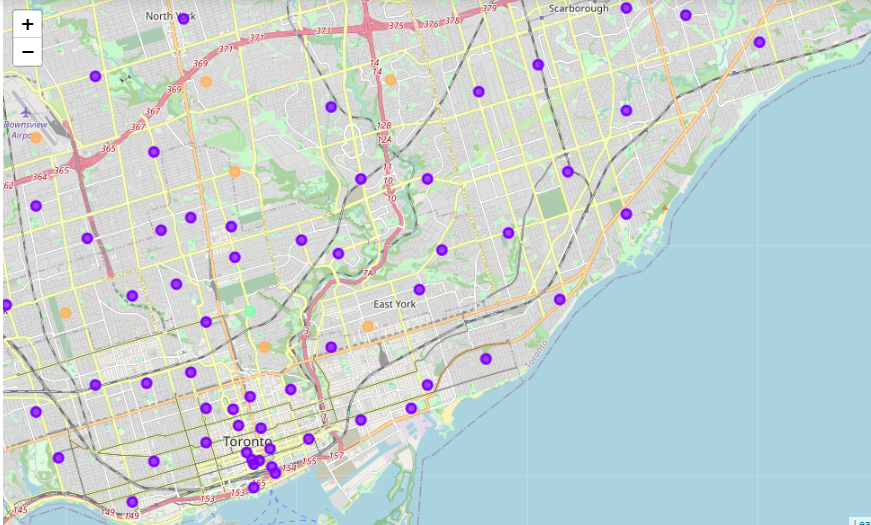

In [73]:
### Cluster 1
Cluster_1 = Toronto_merged.loc[Toronto_merged['Cluster Labels'] == 0, Toronto_merged.columns[[1] + list(range(5, Toronto_merged.shape[1]))]]
Cluster_1
# Cluster_1 

,Borough,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
12,Scarborough,0,Construction & Landscaping,Bar,Yoga Studio,Metro Station,Modern European Restaurant,Mobile Phone Shop,Miscellaneous Shop,Middle Eastern Restaurant,Mexican Restaurant,Men's Store
101,Etobicoke,0,Construction & Landscaping,Baseball Field,Yoga Studio,Metro Station,Modern European Restaurant,Mobile Phone Shop,Miscellaneous Shop,Middle Eastern Restaurant,Mexican Restaurant,Men's Store


In [74]:
#### Cluster 2
Cluster_2 = Toronto_merged.loc[Toronto_merged['Cluster Labels'] == 1, Toronto_merged.columns[[1] + list(range(5, Toronto_merged.shape[1]))]]
Cluster_2
# Cluster_2 

,Borough,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,North York,1,Pizza Place,Coffee Shop,Intersection,Hockey Arena,Portuguese Restaurant,Mediterranean Restaurant,Men's Store,Medical Center,Massage Studio,Martial Arts School
2,Downtown Toronto,1,Coffee Shop,Bakery,Café,Park,Theater,Breakfast Spot,Pub,Electronics Store,Brewery,Chocolate Shop
3,North York,1,Clothing Store,Furniture / Home Store,Women's Store,Coffee Shop,Miscellaneous Shop,Athletics & Sports,Boutique,Accessories Store,Vietnamese Restaurant,Monument / Landmark
4,Queen's Park,1,Coffee Shop,Sushi Restaurant,College Cafeteria,Yoga Studio,Café,Beer Bar,Fried Chicken Joint,Smoothie Shop,Burrito Place,Mexican Restaurant
5,Etobicoke,1,Pizza Place,Men's Store,Modern European Restaurant,Mobile Phone Shop,Miscellaneous Shop,Middle Eastern Restaurant,Mexican Restaurant,Metro Station,Mediterranean Restaurant,Pharmacy
6,Scarborough,1,Print Shop,Fast Food Restaurant,Men's Store,Modern European Restaurant,Mobile Phone Shop,Miscellaneous Shop,Middle Eastern Restaurant,Mexican Restaurant,Metro Station,Yoga Studio
7,North York,1,Gym,Caribbean Restaurant,Japanese Restaurant,Café,Yoga Studio,Miscellaneous Shop,Monument / Landmark,Molecular Gastronomy Restaurant,Modern European Restaurant,Mobile Phone Shop
8,East York,1,Pizza Place,Gastropub,Pharmacy,Flea Market,Bank,Intersection,Athletics & Sports,Gym / Fitness Center,Home Service,Motel
9,Downtown Toronto,1,Coffee Shop,Clothing Store,Cosmetics Shop,Japanese Restaurant,Bubble Tea Shop,Café,Middle Eastern Restaurant,Burger Joint,Pizza Place,Hotel
10,North York,1,Pizza Place,Park,Bakery,Japanese Restaurant,Yoga Studio,Metro Station,Mobile Phone Shop,Miscellaneous Shop,Middle Eastern Restaurant,Mexican Restaurant


In [75]:
### Cluster 3
Cluster_3 = Toronto_merged.loc[Toronto_merged['Cluster Labels'] == 2, Toronto_merged.columns[[1] + list(range(5, Toronto_merged.shape[1]))]]
Cluster_3
# Cluster_3

,Borough,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
98,Etobicoke,2,River,Metro Station,Molecular Gastronomy Restaurant,Modern European Restaurant,Mobile Phone Shop,Miscellaneous Shop,Middle Eastern Restaurant,Mexican Restaurant,Yoga Studio,Monument / Landmark


In [76]:
### Cluster 4
Cluster_4 = Toronto_merged.loc[Toronto_merged['Cluster Labels'] == 3, Toronto_merged.columns[[1] + list(range(5, Toronto_merged.shape[1]))]]
Cluster_4
# Cluster4

,Borough,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
83,Central Toronto,3,Tennis Court,Men's Store,Modern European Restaurant,Mobile Phone Shop,Miscellaneous Shop,Middle Eastern Restaurant,Mexican Restaurant,Metro Station,Mediterranean Restaurant,Monument / Landmark


In [148]:
### Cluster 5
Cluster_5 = Toronto_merged.loc[Toronto_merged['Cluster Labels'] == 4, Toronto_merged.columns[[1] + list(range(5, Toronto_merged.shape[1]))]]
Cluster_5
# Cluster5


,Borough,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,North York,4,Food & Drink Shop,Park,Construction & Landscaping,Yoga Studio,Mobile Phone Shop,Miscellaneous Shop,Middle Eastern Restaurant,Mexican Restaurant,Metro Station,Men's Store
21,York,4,Park,Women's Store,Pool,Men's Store,Modern European Restaurant,Mobile Phone Shop,Miscellaneous Shop,Middle Eastern Restaurant,Mexican Restaurant,Metro Station
35,East YorkEast Toronto,4,Park,Convenience Store,Metro Station,Yoga Studio,Men's Store,Modern European Restaurant,Mobile Phone Shop,Miscellaneous Shop,Middle Eastern Restaurant,Mexican Restaurant
40,North York,4,Business Service,Airport,Park,Yoga Studio,Metro Station,Modern European Restaurant,Mobile Phone Shop,Miscellaneous Shop,Middle Eastern Restaurant,Mexican Restaurant
52,North York,4,Park,Yoga Studio,Mediterranean Restaurant,Mobile Phone Shop,Miscellaneous Shop,Middle Eastern Restaurant,Mexican Restaurant,Metro Station,Men's Store,Medical Center
61,Central Toronto,4,Park,Bus Line,Swim School,Yoga Studio,Metro Station,Mobile Phone Shop,Miscellaneous Shop,Middle Eastern Restaurant,Mexican Restaurant,Men's Store
64,York,4,Park,Jewelry Store,Yoga Studio,Mobile Phone Shop,Miscellaneous Shop,Middle Eastern Restaurant,Mexican Restaurant,Metro Station,Men's Store,Mediterranean Restaurant
66,North York,4,Park,Convenience Store,Yoga Studio,Men's Store,Modern European Restaurant,Mobile Phone Shop,Miscellaneous Shop,Middle Eastern Restaurant,Mexican Restaurant,Metro Station
85,Scarborough,4,Intersection,Playground,Park,Yoga Studio,Men's Store,Mobile Phone Shop,Miscellaneous Shop,Middle Eastern Restaurant,Mexican Restaurant,Metro Station
91,Downtown Toronto,4,Park,Trail,Playground,Yoga Studio,Mobile Phone Shop,Miscellaneous Shop,Middle Eastern Restaurant,Mexican Restaurant,Metro Station,Men's Store


In [150]:
destinations = Cluster_5['5th Most Common Venue']
destinations

0              Mobile Phone Shop
21    Modern European Restaurant
35                   Men's Store
40                 Metro Station
52            Miscellaneous Shop
61                 Metro Station
64            Miscellaneous Shop
66    Modern European Restaurant
85                   Men's Store
91             Mobile Phone Shop
Name: 5th Most Common Venue, dtype: object

## FourSquare API - Montreal, Canada

In [111]:
# Get the neighborhoods Latitude and Longitudes values
M_neighborhood_latitude = Montreal_data.loc[2, 'Latitude'] # neighborhood latitude value
M_neighborhood_longitude = Montreal_data.loc[2, 'Longitude'] # neighborhood longitude value

M_neighborhood_name = Montreal_data.loc[2, 'Neighborhood'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(M_neighborhood_name, 
                                                               M_neighborhood_latitude, 
                                                               M_neighborhood_longitude))

Latitude and longitude values of Downtown Montreal North are 45.44, -75.64.


In [112]:
#### Now, let's get the top 100 venues that are in 'Downtown Montreal' within a radius of 500 meters.
### First, let's create the GET request URL. Name your URL **url**.
# Making a GET request
radius = 500
Montreal_url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            M_neighborhood_latitude, 
            M_neighborhood_longitude, 
            radius, 
            LIMIT)

In [113]:
Montreal_results = requests.get(Montreal_url).json()
Montreal_results

{'meta': {'code': 200, 'requestId': '6084b8ce6f30f8544bfb943b'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Ottawa',
  'headerFullLocation': 'Ottawa',
  'headerLocationGranularity': 'city',
  'totalResults': 15,
  'suggestedBounds': {'ne': {'lat': 45.4445000045, 'lng': -75.63359856711043},
   'sw': {'lat': 45.435499995499995, 'lng': -75.64640143288958}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4b241bc9f964a520456124e3',
       'name': 'Host India',
       'location': {'address': '622 Montreal Rd',
        'lat': 45.44234758872026,
        'lng': -75.64172371803855,
        'labeledLatLngs': [{'label': 'display',
          'lat': 45.44234758872026,
          'lng': -75.

In [114]:
# Montreal, Canada
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [115]:
# Montreal, Canada
venues = Montreal_results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

# Structure the venues in a Panda Dataframe

<ipython-input-115-bdd664359f5b>:4: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  nearby_venues = json_normalize(venues) # flatten JSON


,name,categories,lat,lng
0,Host India,Indian Restaurant,45.442348,-75.641724
1,Farm Boy,Grocery Store,45.442553,-75.644563
2,The Beer Store,Beer Store,45.441819,-75.644766
3,Hess' Your Independent Grocer,Grocery Store,45.441017,-75.643785
4,TD Canada Trust,Bank,45.440879,-75.644391


In [116]:
# Print the number of venues in Foursquares Montreal, Canada
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

15 venues were returned by Foursquare.


In [117]:
# Explore the neighborhood in Montreal
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        Montreal_url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
                    CLIENT_ID, 
                    CLIENT_SECRET, 
                    VERSION, 
                    lat, 
                    lng, 
                    radius, 
                    LIMIT)
            
        # make the GET request
        Montreal_results = requests.get(Montreal_url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in Montreal_results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [118]:
# Create a new dataframe
M_names = Montreal_data['Neighborhood']
M_latitudes = Montreal_data['Latitude']
M_longitudes = Montreal_data['Longitude']
Montreal_venues = getNearbyVenues(M_names, M_latitudes, M_longitudes, radius=500)

Pointe-Aux-Trembles
Saint-Michel East
Downtown Montreal North
McGill University
Notre-Dame-de-Grâce Northeast
Place Bonaventure
Duvernay-Est
Ormeaux Northwest
Montreal East
Ahuntsic North
Downtown Montreal East
Notre-Dame-de-Grâce Southwest
Place Desjardins
Saint-FranÃ§ois
Ormeaux East
Rivière-des-Prairies Northeast
Ahuntsic Central
Griffintown
Saint-Henri
Saint-Vincent-de-Paul
L'Île-Bizard Northeast
Riviere-des-Prairies Southwest
Villeray Northeast
L'Île-Des-Soeurs
Ville Emard
Duvernay
L'Île-Bizard Southwest
Montréal-Nord North
Petite-Patrie Northeast
Downtown Montreal Southeast
Concordia University
Verdun North
Pont-Viau
Dollard-des Southwest
Montreal-Nord South
Plateau Mont-Royal North
Downtown Montreal Southwest
Verdun South
Auteuil West
Sainte-Geneviève
Pierrefonds
Anjou West
Plateau Mont-Royal North Central
Petite-Bourgogne
Cartierville Central
Auteuil Northeast
Kirkland
Anjou East
Centre-Sud North
Point-Saint-Charles
Cartierville Southwest
Auteuil South
Senneville
Mercier North


### Continue Montreal, Canada

In [119]:
## Toronto, Canada
# Using the groupby method to list the count of Neighborhoods
M=Montreal_venues.groupby('Neighborhood').count()
M

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Saint-Laurent Central,6,6,6,6,6,6
Ahuntsic Central,7,7,7,7,7,7
Ahuntsic East,6,6,6,6,6,6
Ahuntsic North,7,7,7,7,7,7
Ahuntsic Southeast,7,7,7,7,7,7
Ahuntsic Southwest,7,7,7,7,7,7
Akwesasne,3,3,3,3,3,3
Anjou East,1,1,1,1,1,1
Anjou West,7,7,7,7,7,7


In [120]:
# Curated Montreal, Canada venues  - 120 Categories
print('There are {} uniques categories.'.format(len(Montreal_venues['Venue Category'].unique())))

There are 120 uniques categories.


In [121]:
### Analyze each neighborhood
# one hot encoding
Montreal_onehot = pd.get_dummies(Montreal_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
Montreal_onehot['Neighborhood'] = Montreal_venues['Neighborhood'] 

# move neighborhood column to the first column
M_fixed_columns = [Montreal_onehot.columns[-1]] + list(Montreal_onehot.columns[:-2]) #The reason why there is a -1 is because
# Yoga Studios would be repeated twice
#Montreal_onehot = Montreal_onehot[M_fixed_columns]

#Montreal_onehot = Montreal_onehot.drop('Neighborhood', axis = 1) # Remove the 'Neighborhood' column
Montreal_onehot


,Accessories Store,Adult Boutique,Art Gallery,Art Museum,Asian Restaurant,BBQ Joint,Bakery,Bank,Bar,Beer Bar,Beer Store,Bike Rental / Bike Share,Boutique,Boxing Gym,Breakfast Spot,Burger Joint,Bus Stop,Café,Caribbean Restaurant,Chocolate Shop,Clothing Store,Coffee Shop,College Rec Center,College Theater,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Creperie,Dance Studio,Department Store,Dessert Shop,Diner,Discount Store,Dive Bar,Electronics Store,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Food Truck,French Restaurant,Fruit & Vegetable Store,Gas Station,Gastropub,Gay Bar,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym Pool,Hawaiian Restaurant,Health Food Store,History Museum,Hostel,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Intersection,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Laser Tag,Lingerie Store,Liquor Store,Lounge,Men's Store,Metro Station,Middle Eastern Restaurant,Movie Theater,Museum,New American Restaurant,Nightclub,Noodle House,Opera House,Paper / Office Supplies Store,Park,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Plaza,Portuguese Restaurant,Poutine Place,Pub,Public Art,Ramen Restaurant,Record Shop,Recreation Center,Residential Building (Apartment / Condo),Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Shoe Store,Shopping Mall,Skate Park,Skating Rink,Smoke Shop,Spa,Spanish Restaurant,Speakeasy,Steakhouse,Strip Club,Student Center,Supermarket,Sushi Restaurant,Szechuan Restaurant,Tattoo Parlor,Tea Room,Tex-Mex Restaurant,Thai Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wine Bar,Women's Store,Yoga Studio,Neighborhood
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Pointe-Aux-Trembles
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Pointe-Aux-Trembles
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Pointe-Aux-Trembles
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Pointe-Aux-Trembles
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Saint-Michel East
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Saint-Michel East
6,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Saint-Michel East
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Saint-Michel East
8,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [122]:
Montreal_onehot.shape

(1088, 121)

In [123]:
# # Taking the mean and frequency of each of the occurences in the category
Montreal_grouped = Montreal_onehot.groupby('Neighborhood').mean().reset_index()
Montreal_grouped

,Neighborhood,Accessories Store,Adult Boutique,Art Gallery,Art Museum,Asian Restaurant,BBQ Joint,Bakery,Bank,Bar,Beer Bar,Beer Store,Bike Rental / Bike Share,Boutique,Boxing Gym,Breakfast Spot,Burger Joint,Bus Stop,Café,Caribbean Restaurant,Chocolate Shop,Clothing Store,Coffee Shop,College Rec Center,College Theater,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Creperie,Dance Studio,Department Store,Dessert Shop,Diner,Discount Store,Dive Bar,Electronics Store,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Food Truck,French Restaurant,Fruit & Vegetable Store,Gas Station,Gastropub,Gay Bar,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym Pool,Hawaiian Restaurant,Health Food Store,History Museum,Hostel,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Intersection,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Laser Tag,Lingerie Store,Liquor Store,Lounge,Men's Store,Metro Station,Middle Eastern Restaurant,Movie Theater,Museum,New American Restaurant,Nightclub,Noodle House,Opera House,Paper / Office Supplies Store,Park,Performing Arts Venue,Pet Store,Pharmacy,Pizza Place,Plaza,Portuguese Restaurant,Poutine Place,Pub,Public Art,Ramen Restaurant,Record Shop,Recreation Center,Residential Building (Apartment / Condo),Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Shoe Store,Shopping Mall,Skate Park,Skating Rink,Smoke Shop,Spa,Spanish Restaurant,Speakeasy,Steakhouse,Strip Club,Student Center,Supermarket,Sushi Restaurant,Szechuan Restaurant,Tattoo Parlor,Tea Room,Tex-Mex Restaurant,Thai Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Wine Bar,Women's Store,Yoga Studio
0,Saint-Laurent Central,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.166667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.166667,0.000000,0.000000,0.000000,0.000000,0.166667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.333333,0.000000,0.000000,0.166667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,Ahuntsic Central,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.142857,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.142857,0.000000,0.000000,0.000000,0.00,0.142857,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.142857,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.285714,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.142857,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,Ahuntsic East,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000

## Continue Montreal, Canada


In [124]:
# The Montreal_grouped size
Montreal_grouped.shape

(120, 121)

### Printing the top 5 most common venues

In [125]:
### Printing the top 5 most common venues
# T is simply an accessor for the transpose() method
num_top_venues = 5

print("The following Ten Dataframes displays the top most 10 'Neighborhoods' of the five most common venues")
print()
i = 0
for hood in Montreal_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = Montreal_grouped[Montreal_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')
    i = i+1
    if i==10:
        break
    else:
        pass






The following Ten Dataframes displays the top most 10 'Neighborhoods' of the five most common venues

---- Saint-Laurent Central----
               venue  freq
0         Restaurant  0.33
1  Convenience Store  0.17
2     Sandwich Place  0.17
3        Gas Station  0.17
4      Grocery Store  0.17


----Ahuntsic Central----
               venue  freq
0        Pizza Place  0.29
1  Convenience Store  0.14
2         Beer Store  0.14
3        Coffee Shop  0.14
4     Ice Cream Shop  0.14


----Ahuntsic East----
               venue  freq
0         Restaurant  0.33
1  Convenience Store  0.17
2     Sandwich Place  0.17
3        Gas Station  0.17
4      Grocery Store  0.17


----Ahuntsic North----
               venue  freq
0        Pizza Place  0.29
1  Convenience Store  0.14
2         Beer Store  0.14
3        Coffee Shop  0.14
4     Ice Cream Shop  0.14


----Ahuntsic Southeast----
               venue  freq
0        Pizza Place  0.29
1  Convenience Store  0.14
2         Beer Store  0.14
3     

### List the top 10 venues with top 5 Neighborhoods

In [126]:
def M_return_most_common_venues(row, num_top_venues):
    M_row_categories = row.iloc[1:]
    M_row_categories_sorted = M_row_categories.sort_values(ascending=False)
    
    return M_row_categories_sorted.index.values[0:num_top_venues]

In [127]:
### Now let's create the new dataframe and display the top 10 venues for each neighborhood.

num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
M_neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
M_neighborhoods_venues_sorted['Neighborhood'] = Montreal_grouped['Neighborhood']

for ind in np.arange(Montreal_grouped.shape[0]):
    M_neighborhoods_venues_sorted.iloc[ind, 1:] = M_return_most_common_venues(Montreal_grouped.iloc[ind, :], num_top_venues)

M_neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Saint-Laurent Central,Restaurant,Convenience Store,Sandwich Place,Gas Station,Grocery Store,Accessories Store,Paper / Office Supplies Store,Pub,Poutine Place,Portuguese Restaurant
1,Ahuntsic Central,Pizza Place,Convenience Store,Beer Store,Coffee Shop,Ice Cream Shop,Sandwich Place,Performing Arts Venue,Pet Store,Pharmacy,Accessories Store
2,Ahuntsic East,Restaurant,Convenience Store,Sandwich Place,Gas Station,Grocery Store,Accessories Store,Paper / Office Supplies Store,Pub,Poutine Place,Portuguese Restaurant
3,Ahuntsic North,Pizza Place,Convenience Store,Beer Store,Coffee Shop,Ice Cream Shop,Sandwich Place,Performing Arts Venue,Pet Store,Pharmacy,Accessories Store
4,Ahuntsic Southeast,Pizza Place,Convenience Store,Beer Store,Coffee Shop,Ice Cream Shop,Sandwich Place,Performing Arts Venue,Pet Store,Pharmacy,Accessories Store


In [128]:
Montreal_grouped_clustering = Montreal_grouped.drop('Neighborhood',axis = 1)

## K-Means Montreal, Canada

In [129]:
# Run _k_-means to cluster the neighborhood into 5 clusters.
# set number of clusters
kclusters = 5

# run k-means clustering
M_kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Montreal_grouped_clustering)

# check cluster labels generated for each row in the dataframe
M_kmeans.labels_[0:30]

array([2, 1, 2, 1, 1, 1, 0, 4, 1, 1, 3, 1, 1, 1, 2, 3, 3, 1, 1, 1, 3, 1,
       1, 1, 1, 1, 1, 1, 1, 1])

In [130]:
# add clustering labels Montreal, Canada
M_neighborhoods_venues_sorted.insert(0, 'Cluster Labels', M_kmeans.labels_)

Montreal_merged = Montreal_data

# merge Toronto_grouped with Toronto_data to add latitude/longitude for each neighborhood
Montreal_merged = Montreal_merged.join(M_neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood',how ='inner')

Montreal_merged.head() # check the last columns!

,PostalCode,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,H1A,Pointe-aux-Trembles,Pointe-Aux-Trembles,45.67,-73.50,0,Bus Stop,Convenience Store,Construction & Landscaping,Pharmacy,Recreation Center,Ramen Restaurant,Public Art,Pub,Poutine Place,Portuguese Restaurant
1,H2A,"Saint-Michel district, Quebec",Saint-Michel East,45.44,-75.64,3,Grocery Store,Bank,Restaurant,Indian Restaurant,Greek Restaurant,Pet Store,Beer Store,Coffee Shop,Vietnamese Restaurant,Fast Food Restaurant
2,H3A,Downtown Montreal,Downtown Montreal North,45.44,-75.64,3,Grocery Store,Bank,Restaurant,Indian Restaurant,Greek Restaurant,Pet Store,Beer Store,Coffee Shop,Vietnamese Restaurant,Fast Food Restaurant
3,H4A,McGill University,McGill University,45.44,-75.64,3,Grocery Store,Bank,Restaurant,Indian Restaurant,Greek Restaurant,Pet Store,Beer Store,Coffee Shop,Vietnamese Restaurant,Fast Food Restaurant
4,H5A,"Notre-Dame-de-Grâce, Quebec",Notre-Dame-de-Grâce Northeast,45.44,-75.64,3,Grocery Store,Bank,Restaurant,Indian Restaurant,Greek Restaurant,Pet Store,Beer Store,Coffee Shop,Vietnamese Restaurant,Fast Food Restaurant


In [145]:
# create map
Montreal_map_clusters = folium.Map(location=[M_neighborhood_latitude, M_neighborhood_longitude], zoom_start=11)
kclusters = 5
# set color scheme for the clusters
M_x = np.arange(kclusters)
M_ys = [i + x + (i*M_x)**2 for i in range(kclusters)]
M_colors_array = cm.rainbow(np.linspace(0, 1, len(M_ys)))
M_rainbow = [colors.rgb2hex(i) for i in M_colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Montreal_merged['Latitude'], Montreal_merged['Longitude'], Montreal_merged['Neighborhood'], Montreal_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(Montreal_map_clusters)
       
Montreal_map_clusters

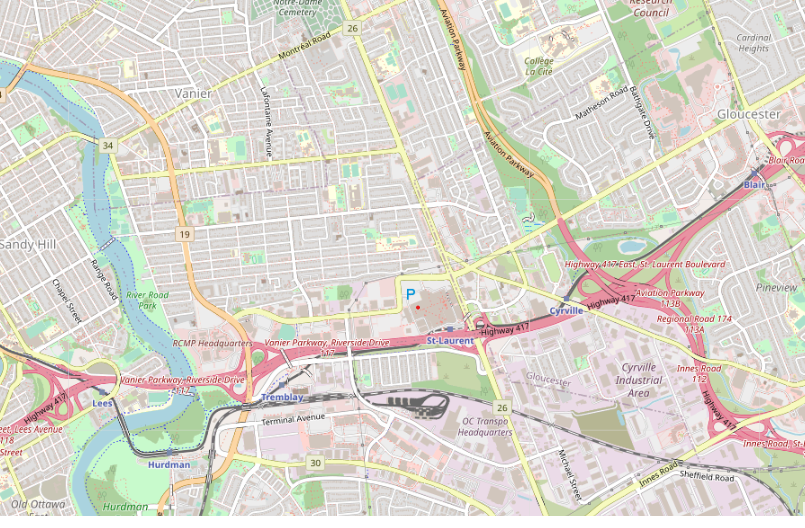

## Clusters Montreal, Canada

In [136]:
### Montreal Cluster 1
M_Cluster_1 = Montreal_merged.loc[Montreal_merged['Cluster Labels'] == 0, Montreal_merged.columns[[1] + list(range(Montreal_merged.shape[1]))]]
M_Cluster_1
# Cluster_1 

,Borough,PostalCode,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Pointe-aux-Trembles,H1A,Pointe-aux-Trembles,Pointe-Aux-Trembles,45.67,-73.50,0,Bus Stop,Convenience Store,Construction & Landscaping,Pharmacy,Recreation Center,Ramen Restaurant,Public Art,Pub,Poutine Place,Portuguese Restaurant
62,Akwesasne,H1N,Akwesasne,Akwesasne,45.58,-73.52,0,Bus Stop,Liquor Store,Accessories Store,Public Art,Pub,Poutine Place,Portuguese Restaurant,Plaza,Pizza Place,Pharmacy


In [137]:
### Montreal Cluster 2
M_Cluster_2 = Montreal_merged.loc[Montreal_merged['Cluster Labels'] == 1, Montreal_merged.columns[[1] + list(range(Montreal_merged.shape[1]))]]
M_Cluster_2
# Cluster_2 

,Borough,PostalCode,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
8,"Montreal East, Quebec",H2B,"Montreal East, Quebec",Montreal East,44.42,-80.10,1,Pizza Place,Convenience Store,Beer Store,Coffee Shop,Ice Cream Shop,Sandwich Place,Performing Arts Venue,Pet Store,Pharmacy,Accessories Store
9,"Ahuntsic, Quebec",H3B,"Ahuntsic, Quebec",Ahuntsic North,44.42,-80.10,1,Pizza Place,Convenience Store,Beer Store,Coffee Shop,Ice Cream Shop,Sandwich Place,Performing Arts Venue,Pet Store,Pharmacy,Accessories Store
10,Downtown Montreal,H4B,Downtown Montreal,Downtown Montreal East,44.42,-80.10,1,Pizza Place,Convenience Store,Beer Store,Coffee Shop,Ice Cream Shop,Sandwich Place,Performing Arts Venue,Pet Store,Pharmacy,Accessories Store
11,"Notre-Dame-de-Grâce, Quebec",H5B,"Notre-Dame-de-Grâce, Quebec",Notre-Dame-de-Grâce Southwest,44.42,-80.10,1,Pizza Place,Convenience Store,Beer Store,Coffee Shop,Ice Cream Shop,Sandwich Place,Performing Arts Venue,Pet Store,Pharmacy,Accessories Store
12,Place Desjardins,H7B,Place Desjardins,Place Desjardins,44.42,-80.10,1,Pizza Place,Convenience Store,Beer Store,Coffee Shop,Ice Cream Shop,Sandwich Place,Performing Arts Venue,Pet Store,Pharmacy,Accessories Store
13,"Saint-François, Laval, Quebec",H9B,"Saint-François, Laval, Quebec",Saint-FranÃ§ois,44.42,-80.10,1,Pizza Place,Convenience Store,Beer Store,Coffee Shop,Ice Cream Shop,Sandwich Place,Performing Arts Venue,Pet Store,Pharmacy,Accessories Store
15,Rivière-des-Prairies,H2C,Rivière-des-Prairies,Rivière-des-Prairies Northeast,44.42,-80.10,1,Pizza Place,Convenience Store,Beer Store,Coffee Shop,Ice Cream Shop,Sandwich Place,Performing Arts Venue,Pet Store,Pharmacy,Accessories Store
16,"Ahuntsic, Quebec",H3C,"Ahuntsic, Quebec",Ahuntsic Central,44.42,-80.10,1,Pizza Place,Convenience Store,Beer Store,Coffee Shop,Ice Cream Shop,Sandwich Place,Performing Arts Venue,Pet Store,Pharmacy,Accessories Store
17,"Griffintown, Quebec",H4C,"Griffintown, Quebec",Griffintown,44.42,-80.10,1,Pizza Place,Convenience Store,Beer Store,Coffee Shop,Ice Cream Shop,Sandwich Place,Performing Arts Venue,Pet Store,Pharmacy,Accessories Store
21,"Saint-Henri, Montreal",H2E,"Saint-Henri, Montreal",Saint-Henri,44.42,-80.10,1,Pizza Place,Convenience Store,Beer Store,Coffee Shop,Ice Cream Shop,Sandwich Place,Performing Arts Venue,Pet Store,Pharmacy,Accessories Store


In [138]:
### Montreal Cluster 3
M_Cluster_3 = Montreal_merged.loc[Montreal_merged['Cluster Labels'] == 2, Montreal_merged.columns[[1] + list(range(Montreal_merged.shape[1]))]]
M_Cluster_3
# Cluster_3 

,Borough,PostalCode,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
63,Mercier (Montreal),H2N,Mercier (Montreal),Mercier West,47.99,-84.77,2,Restaurant,Convenience Store,Sandwich Place,Gas Station,Grocery Store,Accessories Store,Paper / Office Supplies Store,Pub,Poutine Place,Portuguese Restaurant
64,"Ahuntsic, Quebec",H3N,"Ahuntsic, Quebec",Ahuntsic East,47.99,-84.77,2,Restaurant,Convenience Store,Sandwich Place,Gas Station,Grocery Store,Accessories Store,Paper / Office Supplies Store,Pub,Poutine Place,Portuguese Restaurant
65,"Cartierville, Quebec",H4N,"Cartierville, Quebec",Cartierville Northeast,47.99,-84.77,2,Restaurant,Convenience Store,Sandwich Place,Gas Station,Grocery Store,Accessories Store,Paper / Office Supplies Store,Pub,Poutine Place,Portuguese Restaurant
66,"Saint-Laurent, Quebec",H7N,"Saint-Laurent, Quebec",Saint-Laurent East,47.99,-84.77,2,Restaurant,Convenience Store,Sandwich Place,Gas Station,Grocery Store,Accessories Store,Paper / Office Supplies Store,Pub,Poutine Place,Portuguese Restaurant
67,"Vimont, Quebec",H8N,"Vimont, Quebec",Vimont,47.99,-84.77,2,Restaurant,Convenience Store,Sandwich Place,Gas Station,Grocery Store,Accessories Store,Paper / Office Supplies Store,Pub,Poutine Place,Portuguese Restaurant
83,"Mount Royal, Quebec",H1S,"Mount Royal, Quebec",Mount Royal Central,47.99,-84.77,2,Restaurant,Convenience Store,Sandwich Place,Gas Station,Grocery Store,Accessories Store,Paper / Office Supplies Store,Pub,Poutine Place,Portuguese Restaurant
84,"Saint-Laurent, Quebec",H2S,"Saint-Laurent, Quebec",Saint-Laurent Central,47.99,-84.77,2,Restaurant,Convenience Store,Sandwich Place,Gas Station,Grocery Store,Accessories Store,Paper / Office Supplies Store,Pub,Poutine Place,Portuguese Restaurant
85,Laval-sur-le-Lac,H3S,Laval-sur-le-Lac,Laval-sur-le-Lac,47.99,-84.77,2,Restaurant,Convenience Store,Sandwich Place,Gas Station,Grocery Store,Accessories Store,Paper / Office Supplies Store,Pub,Poutine Place,Portuguese Restaurant
86,"Ville Saint-Pierre, Quebec",H4S,"Ville Saint-Pierre, Quebec",Ville Saint-Pierre,47.99,-84.77,2,Restaurant,Convenience Store,Sandwich Place,Gas Station,Grocery Store,Accessories Store,Paper / Office Supplies Store,Pub,Poutine Place,Portuguese Restaurant
87,"LaSalle, Quebec",H7S,"LaSalle, Quebec",LaSalle West,47.99,-84.77,2,Restaurant,Convenience Store,Sandwich Place,Gas Station,Grocery Store,Accessories Store,Paper / Office Supplies Store,Pub,Poutine Place,Portuguese Restaurant


In [139]:
### Montreal Cluster 4
M_Cluster_4 = Montreal_merged.loc[Montreal_merged['Cluster Labels'] == 3, Montreal_merged.columns[[1] + list(range(Montreal_merged.shape[1]))]]
M_Cluster_4
# Cluster_4

,Borough,PostalCode,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,"Saint-Michel district, Quebec",H2A,"Saint-Michel district, Quebec",Saint-Michel East,45.44,-75.64,3,Grocery Store,Bank,Restaurant,Indian Restaurant,Greek Restaurant,Pet Store,Beer Store,Coffee Shop,Vietnamese Restaurant,Fast Food Restaurant
2,Downtown Montreal,H3A,Downtown Montreal,Downtown Montreal North,45.44,-75.64,3,Grocery Store,Bank,Restaurant,Indian Restaurant,Greek Restaurant,Pet Store,Beer Store,Coffee Shop,Vietnamese Restaurant,Fast Food Restaurant
3,McGill University,H4A,McGill University,McGill University,45.44,-75.64,3,Grocery Store,Bank,Restaurant,Indian Restaurant,Greek Restaurant,Pet Store,Beer Store,Coffee Shop,Vietnamese Restaurant,Fast Food Restaurant
4,"Notre-Dame-de-Grâce, Quebec",H5A,"Notre-Dame-de-Grâce, Quebec",Notre-Dame-de-Grâce Northeast,45.44,-75.64,3,Grocery Store,Bank,Restaurant,Indian Restaurant,Greek Restaurant,Pet Store,Beer Store,Coffee Shop,Vietnamese Restaurant,Fast Food Restaurant
5,Place Bonaventure,H7A,Place Bonaventure,Place Bonaventure,45.44,-75.64,3,Grocery Store,Bank,Restaurant,Indian Restaurant,Greek Restaurant,Pet Store,Beer Store,Coffee Shop,Vietnamese Restaurant,Fast Food Restaurant
6,"Duvernay-Est, Quebec",H9A,"Duvernay-Est, Quebec",Duvernay-Est,45.44,-75.64,3,Grocery Store,Bank,Restaurant,Indian Restaurant,Greek Restaurant,Pet Store,Beer Store,Coffee Shop,Vietnamese Restaurant,Fast Food Restaurant
7,Dollard-des-Ormeaux,H1B,Dollard-des-Ormeaux,Ormeaux Northwest,45.65,-73.51,3,Restaurant,Italian Restaurant,Liquor Store,Pharmacy,Breakfast Spot,Grocery Store,Lingerie Store,Paper / Office Supplies Store,Pub,Juice Bar
14,Dollard-des-Ormeaux,H1C,Dollard-des-Ormeaux,Ormeaux East,45.65,-73.51,3,Restaurant,Italian Restaurant,Liquor Store,Pharmacy,Breakfast Spot,Grocery Store,Lingerie Store,Paper / Office Supplies Store,Pub,Juice Bar
28,"Duvernay, Quebec",H3G,"Duvernay, Quebec",Duvernay,45.50,-73.58,3,Café,Italian Restaurant,Hotel,Art Museum,Clothing Store,Sandwich Place,Burger Joint,Indian Restaurant,Juice Bar,Middle Eastern Restaurant
46,The Plateau,H2K,The Plateau,Plateau Mont-Royal North Central,45.54,-73.55,3,Fruit & Vegetable Store,Metro Station,Skating Rink,Gym Pool,Skate Park,Convenience Store,Sushi Restaurant,Pizza Place,Tex-Mex Restaurant,Park


In [155]:
Toronto_5th = Cluster_5['5th Most Common Venue'] 
Montreal_4th =  M_Cluster_4['2nd Most Common Venue']
print(Toronto_5th, '\n',Montreal_4th)


0              Mobile Phone Shop
21    Modern European Restaurant
35                   Men's Store
40                 Metro Station
52            Miscellaneous Shop
61                 Metro Station
64            Miscellaneous Shop
66    Modern European Restaurant
85                   Men's Store
91             Mobile Phone Shop
Name: 5th Most Common Venue, dtype: object 
 1                       Bank
2                       Bank
3                       Bank
4                       Bank
5                       Bank
6                       Bank
7         Italian Restaurant
14        Italian Restaurant
28        Italian Restaurant
46             Metro Station
52     Vietnamese Restaurant
53                      Bank
54                      Bank
55                      Bank
101            Metro Station
108               Restaurant
Name: 2nd Most Common Venue, dtype: object


In [140]:
### Montreal Cluster 5
M_Cluster_5 = Montreal_merged.loc[Montreal_merged['Cluster Labels'] == 4, Montreal_merged.columns[[1] + list(range(Montreal_merged.shape[1]))]]
M_Cluster_5
# Cluster_5 

,Borough,PostalCode,Borough,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
51,"Anjou, Quebec",H1L,"Anjou, Quebec",Anjou East,45.6,-73.51,4,Diner,Accessories Store,Japanese Restaurant,Public Art,Pub,Poutine Place,Portuguese Restaurant,Plaza,Pizza Place,Pharmacy


## Step 6:
## Choosing which destination of a family vacation


Toronto, Canada
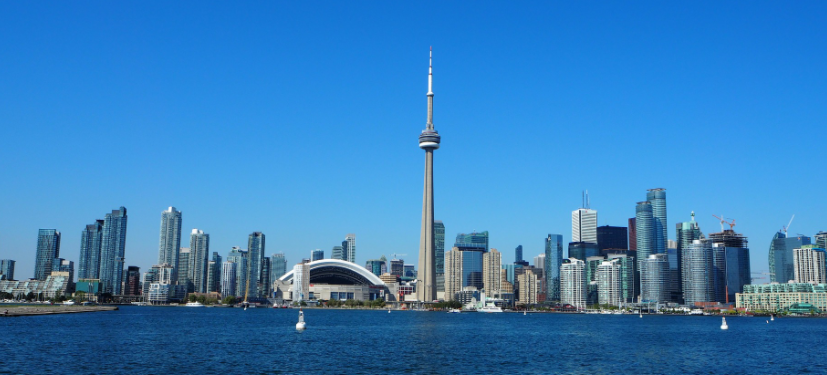


Toronto, Canada
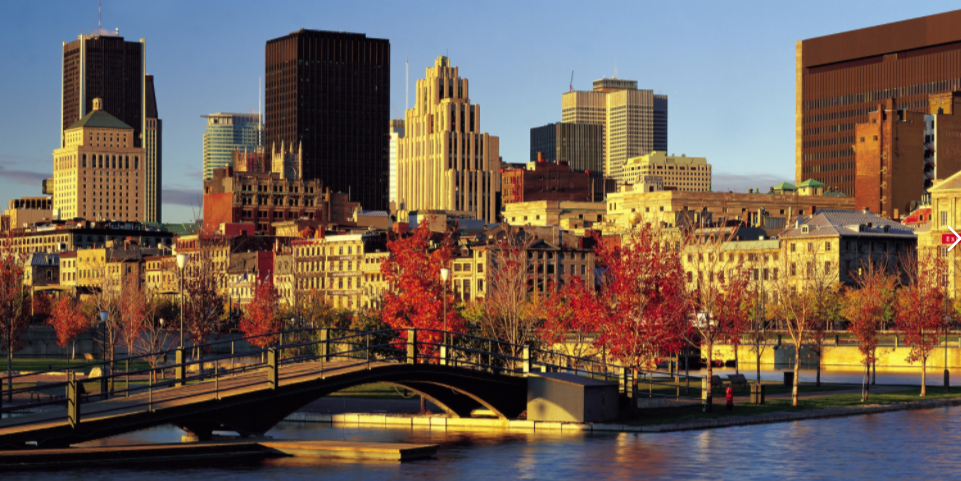


## Both cities of Toronto and Montreal are beautiful canadian destinations
Toronto feels like a metropolis and Montreal feels like a historic cultural center place. 

In [157]:
# By looking at some of the hot spots on each city venues, it seems as if Toronto gave a better hot spot locations
# Both cities have great resturants to eat. 
Toronto_5th = Cluster_5['5th Most Common Venue'] 
Montreal_4th =  M_Cluster_4['2nd Most Common Venue']
print(Toronto_5th, 3*'\n',Montreal_4th)


0              Mobile Phone Shop
21    Modern European Restaurant
35                   Men's Store
40                 Metro Station
52            Miscellaneous Shop
61                 Metro Station
64            Miscellaneous Shop
66    Modern European Restaurant
85                   Men's Store
91             Mobile Phone Shop
Name: 5th Most Common Venue, dtype: object 


 1                       Bank
2                       Bank
3                       Bank
4                       Bank
5                       Bank
6                       Bank
7         Italian Restaurant
14        Italian Restaurant
28        Italian Restaurant
46             Metro Station
52     Vietnamese Restaurant
53                      Bank
54                      Bank
55                      Bank
101            Metro Station
108               Restaurant
Name: 2nd Most Common Venue, dtype: object


# By the venues and thanks to Foursquare API, we have selected Toronto, Canada for our family vacation!!!!